In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras 
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import image_dataset_from_directory
from keras.layers import Conv2D, Dense, MaxPooling2D, Dropout,Flatten
from keras.models import Model
from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model

In [3]:
from tensorflow.keras.models import load_model

vgg_gray_model = load_model('vgg_gray_model1.h5')
vgg_color_model = load_model('vgg_color_model.h5')
vgg_segmented_model = load_model('vgg_segmented_model.h5')

inception_gray_model = load_model('Inception_gray_model.h5')
inception_color_model = load_model('Inception_color_model.h5')
inception_segmented_model = load_model('Inception_segmented_model.h5')

In [4]:
train_gen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    shear_range=0.2,
    zoom_range=0.2,
    width_shift_range=0.05,
    height_shift_range=0.05,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
)

valid_gen = ImageDataGenerator(
    rescale=1./255,  # Corrected rescale parameter
    validation_split=0.2,
    
)

Image_size = (255, 255)
Batch_size = 32

In [5]:
data_dir_grayscale = r"E:\archive (1)\dataset2\plantvillage dataset\grayscale"
train_generator_grayscale = train_gen.flow_from_directory(
    data_dir_grayscale,
    target_size=Image_size,
    batch_size=Batch_size,
    subset="training",
    class_mode="categorical",
    color_mode="rgb",  
    
)

valid_generator_grayscale = valid_gen.flow_from_directory(
    data_dir_grayscale,
    target_size=Image_size,
    batch_size=Batch_size,
    subset="validation",
    class_mode="categorical",
    color_mode="rgb",  
    seed = 106
      
)

Found 43456 images belonging to 38 classes.
Found 10849 images belonging to 38 classes.


In [27]:
batch_images_gray, batch_labels_gray = valid_generator_grayscale.next()


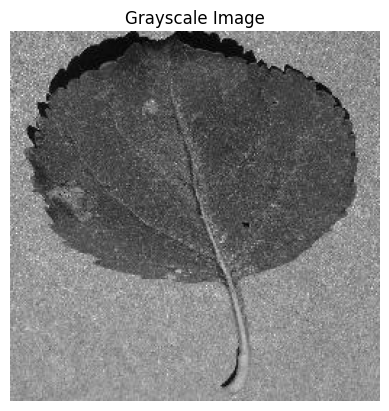

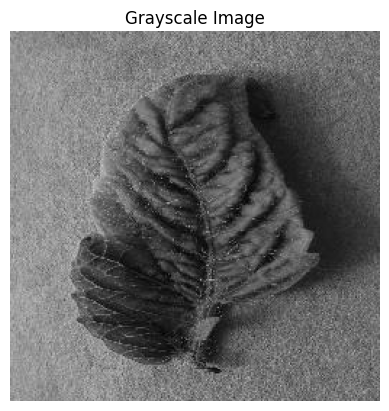

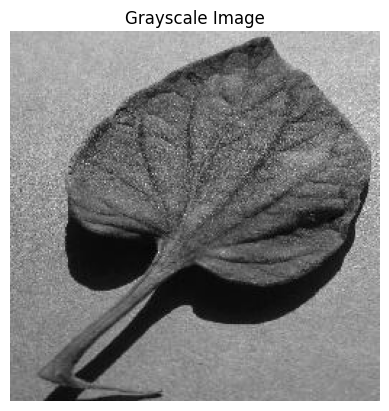

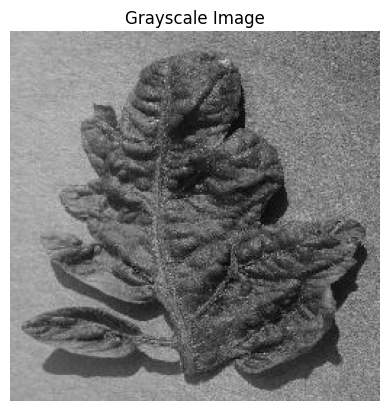

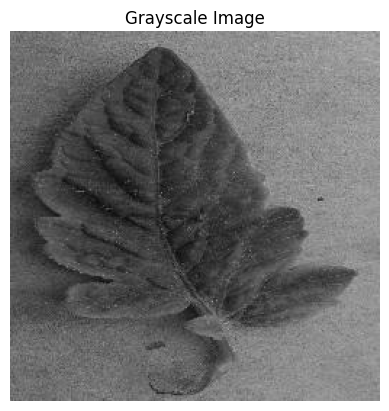

...

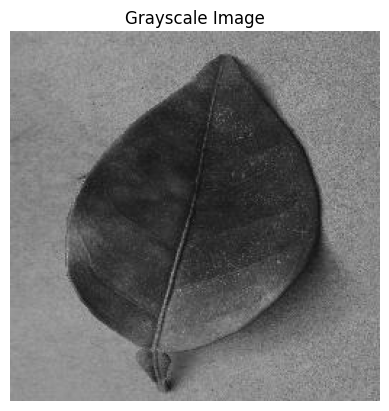

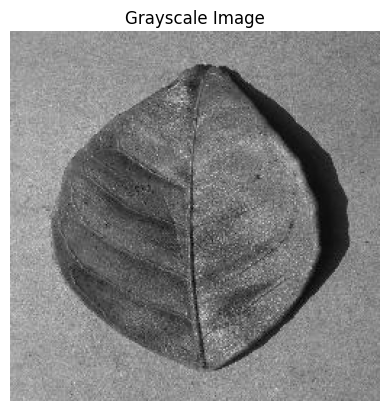

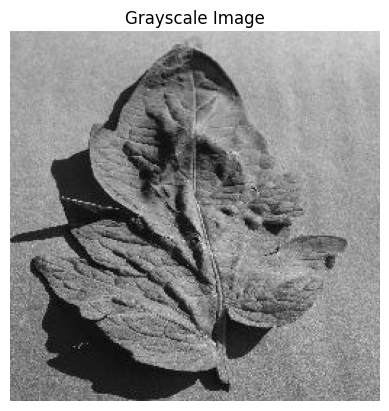

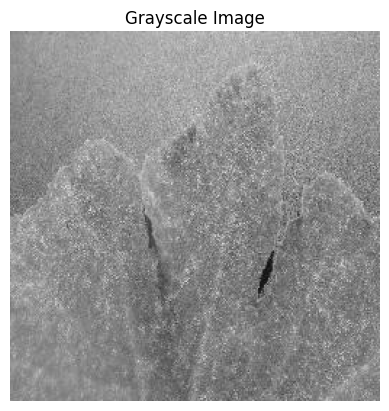

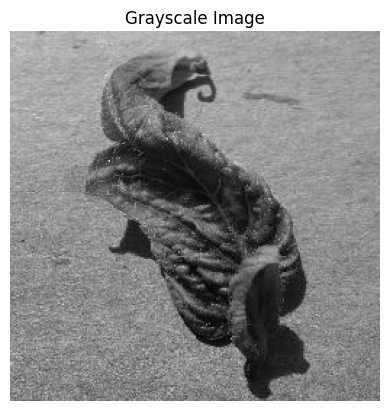

In [28]:
import matplotlib.pyplot as plt

for i in range(len(batch_images_gray)):
    
    img_gray = batch_images_gray[i]
    
    
    # Display grayscale image
    plt.imshow(img_gray.squeeze(), cmap='gray')
    plt.title("Grayscale Image")
    plt.axis('off')
    plt.show()

In [6]:
import numpy as np
import matplotlib.pyplot as plt

class_names = [
    'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy',
    'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy',
    'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_',
    'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot',
    'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy',
    'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy',
    'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight',
    'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy',
    'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy',
    'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold',
    'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot',
    'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy'
]

In [30]:
inception_preds_grayscale = inception_gray_model.predict(batch_images_gray)
vgg16_preds_grayscale = vgg_gray_model.predict(batch_images_gray)
ensemble_preds_grayscale = (inception_preds_grayscale + vgg16_preds_grayscale) / 2
ensemble_predicted_classes_grayscale = np.argmax(ensemble_preds_grayscale, axis=1)

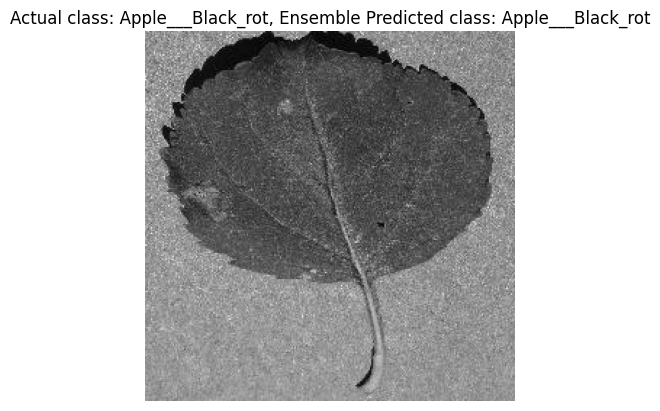

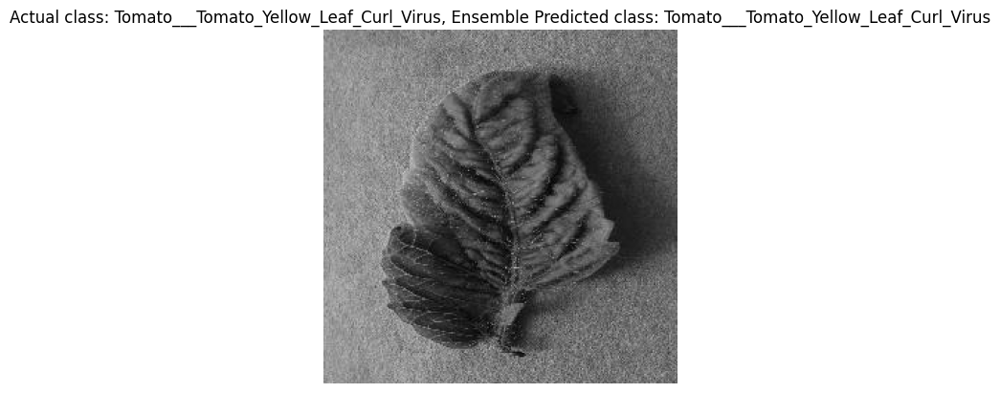

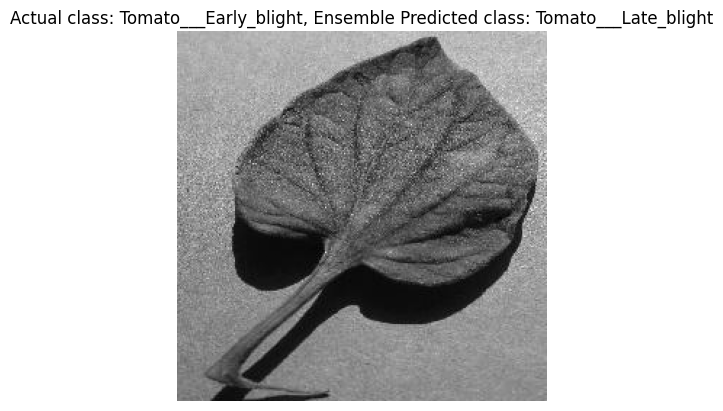

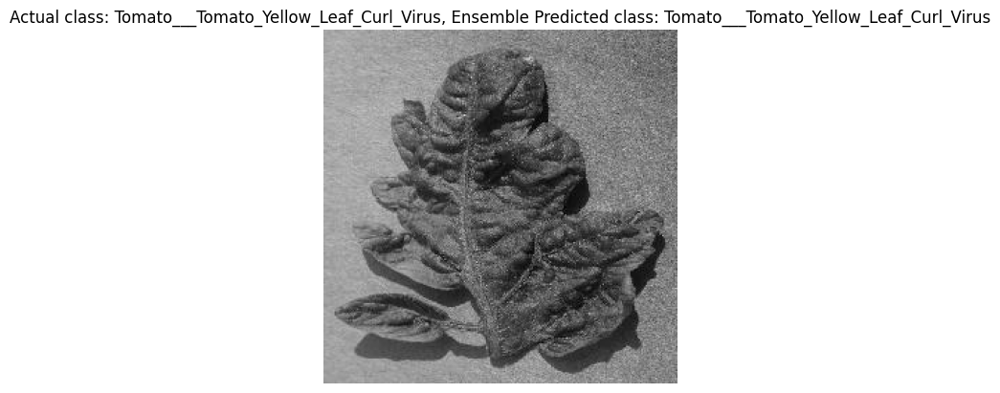

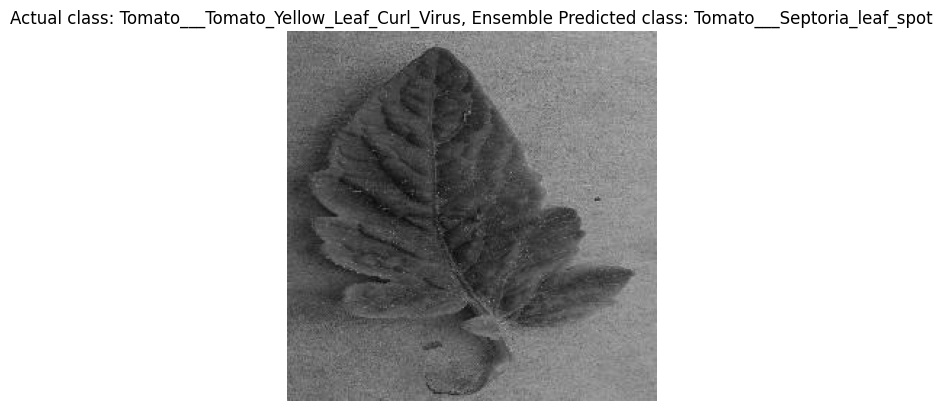

...

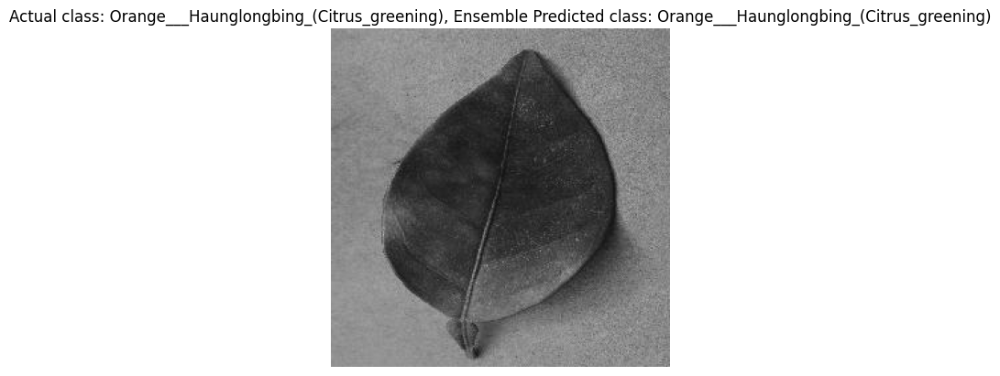

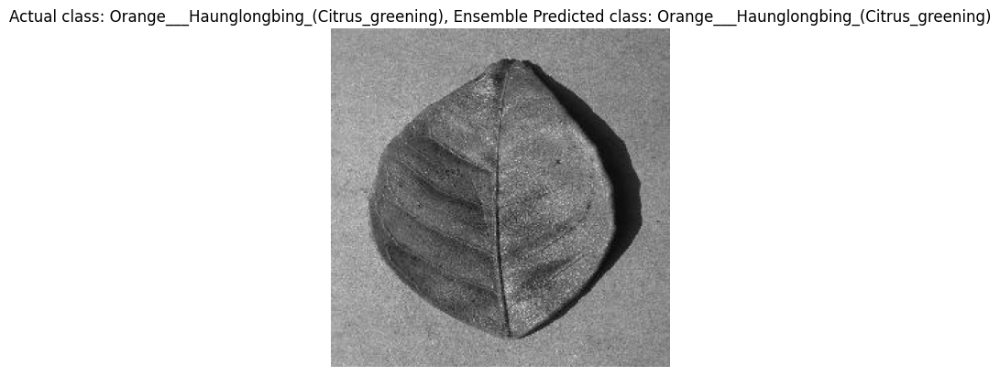

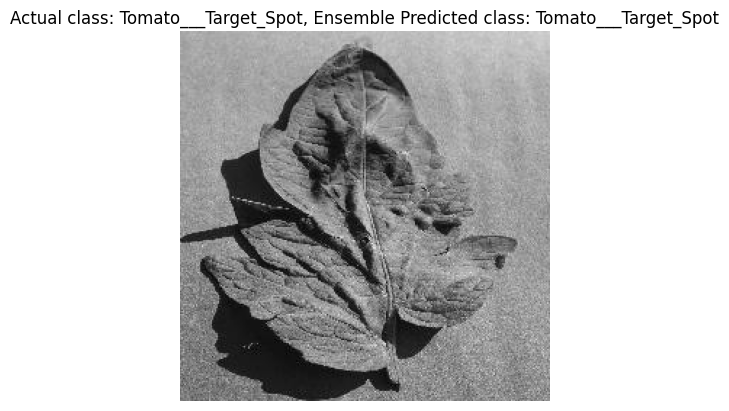

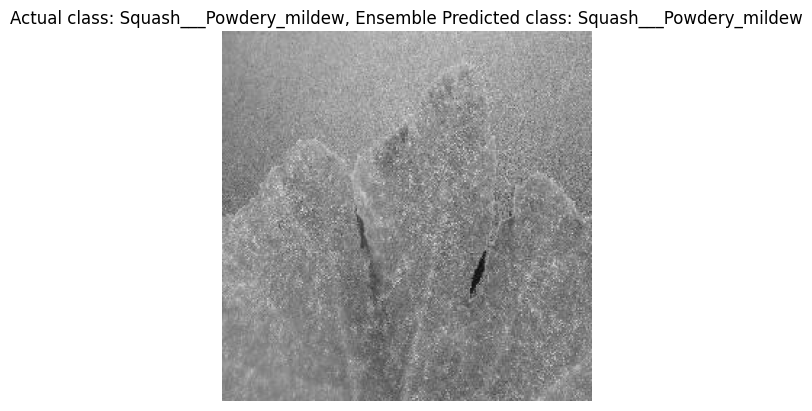

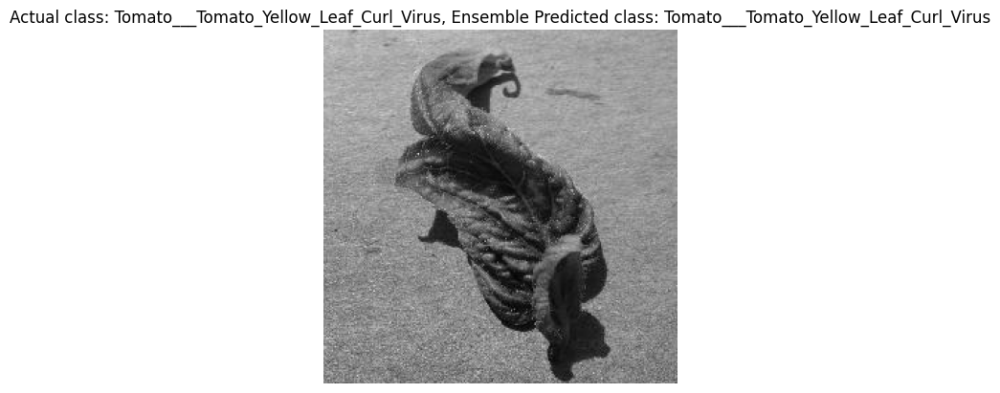

In [33]:
for i in range(len(batch_labels_gray)):
    # Load and display the image
    img = batch_images_gray[i]
    plt.imshow(img)
    plt.axis('off')

    # Display the actual and predicted classes for the ensemble
    actual_class = class_names[np.argmax(batch_labels_gray[i])]
    ensemble_predicted_class = class_names[ensemble_predicted_classes_grayscale[i]]
    plt.title(f"Actual class: {actual_class}, Ensemble Predicted class: {ensemble_predicted_class}")
    plt.show()

Inception Model Accuracy: 0.8125
VGG16 Model Accuracy: 0.8125
Ensemble Model Accuracy: 0.84375


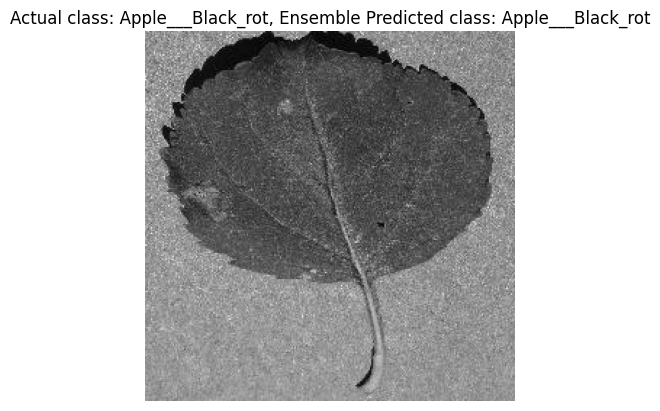

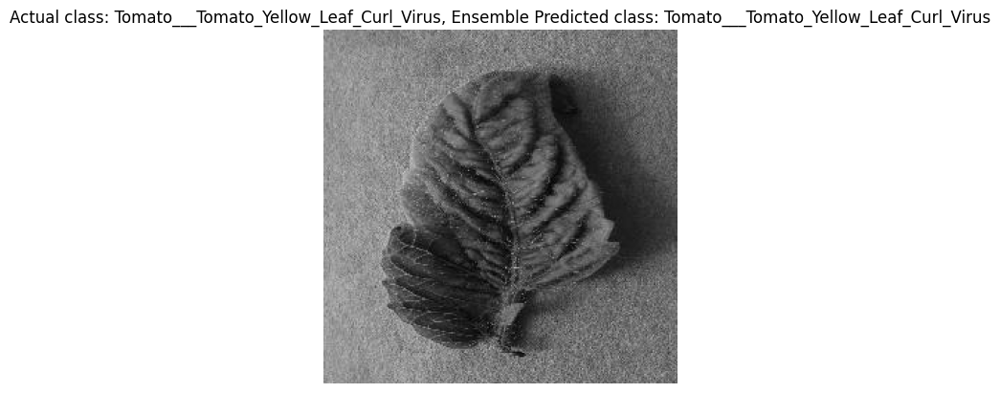

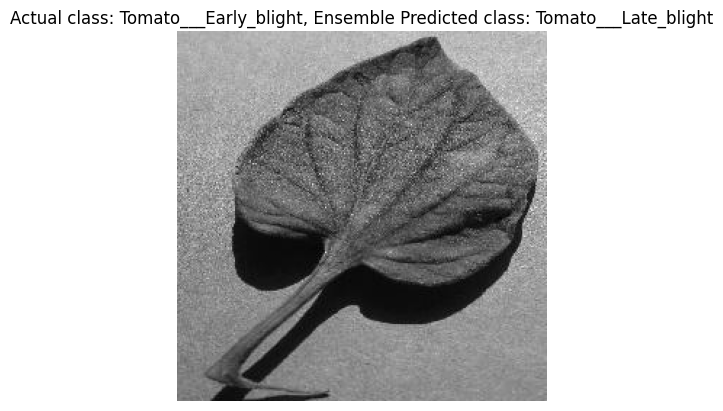

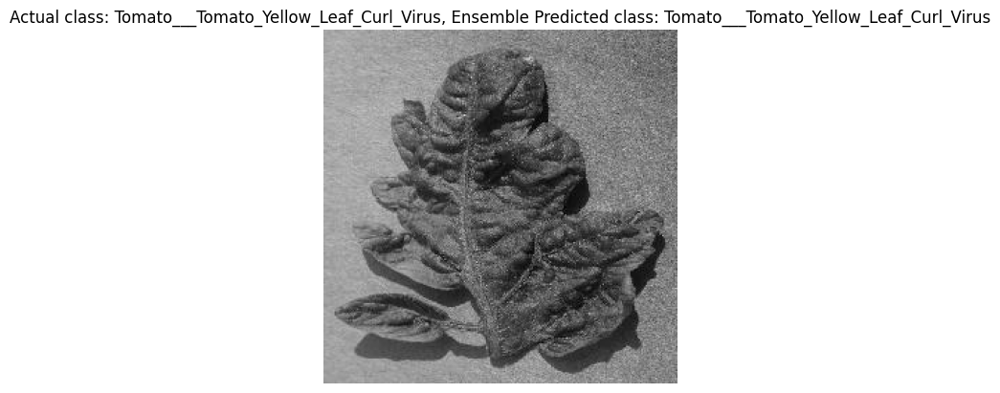

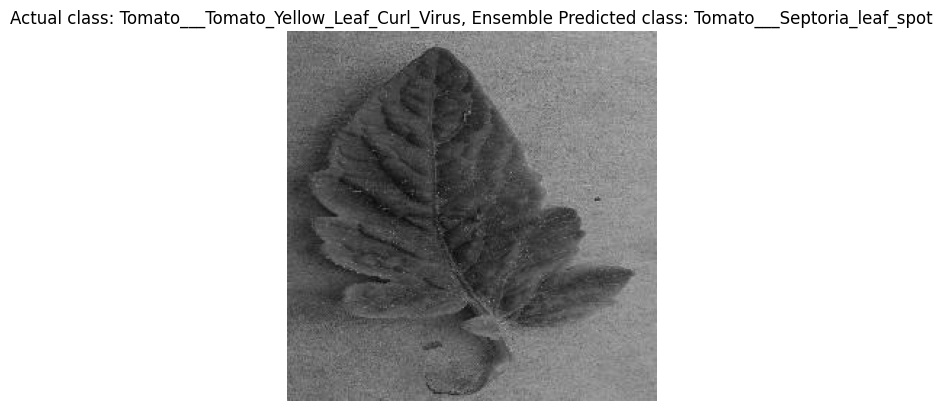

...

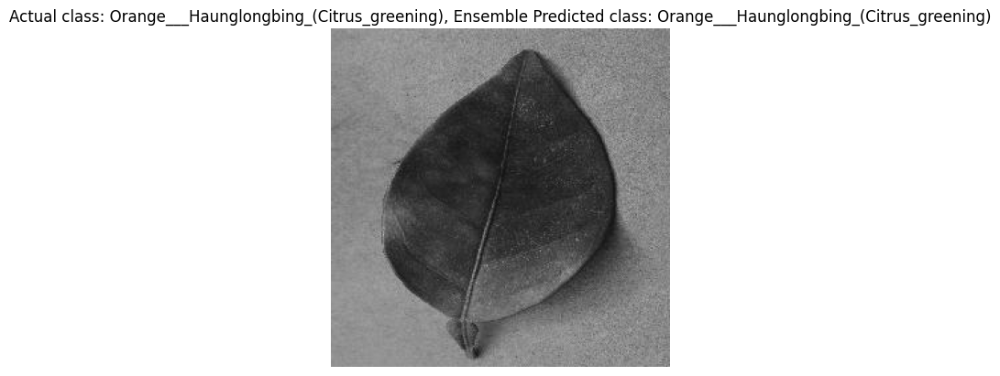

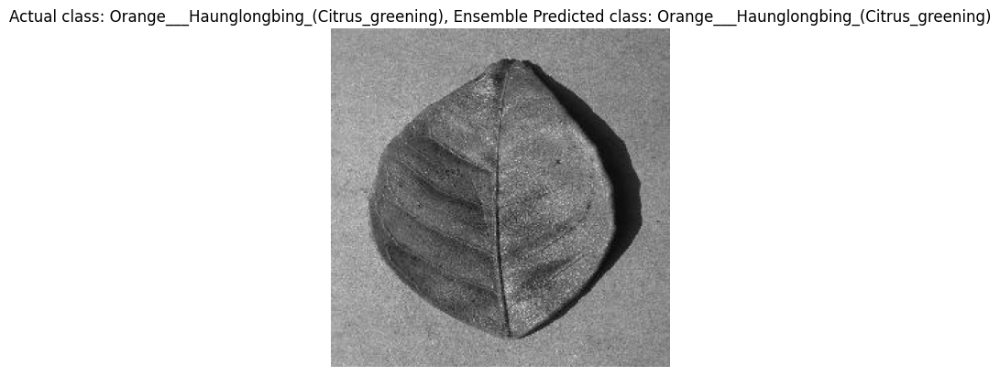

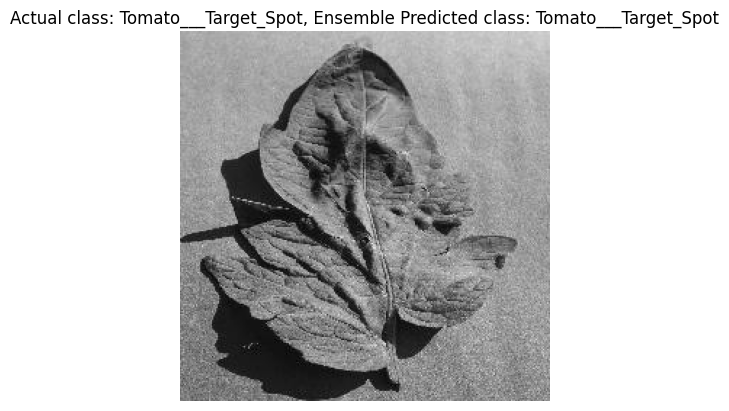

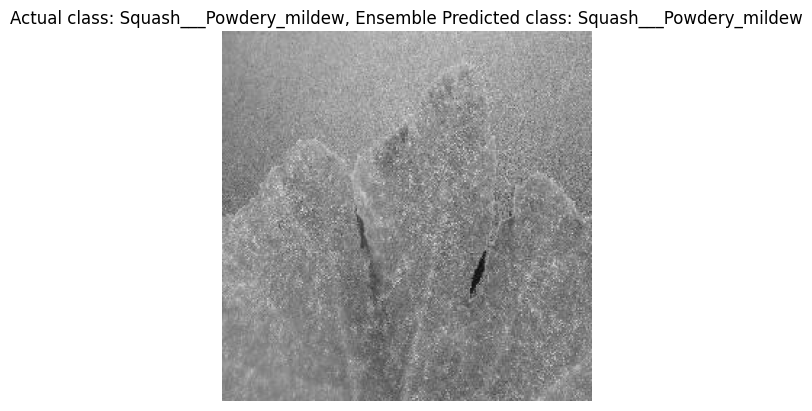

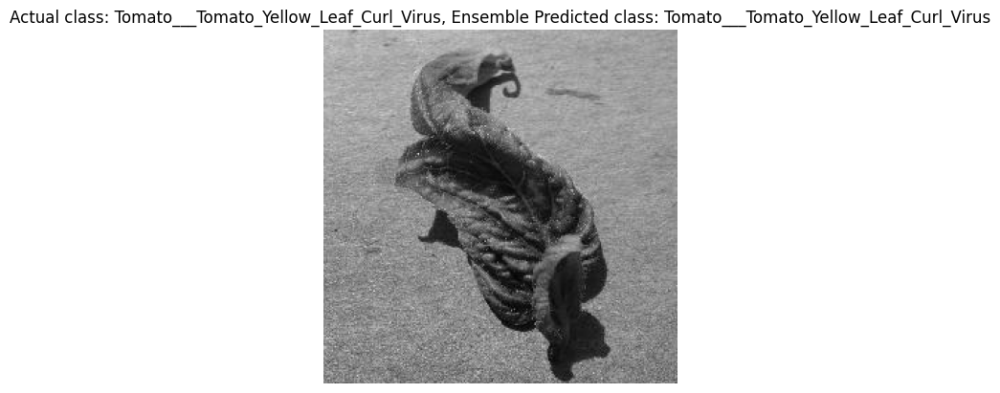

In [34]:
from sklearn.metrics import accuracy_score

# Calculate accuracy of each individual model
inception_accuracy_grayscale = accuracy_score(np.argmax(batch_labels_gray, axis=1), np.argmax(inception_preds_grayscale, axis=1))
vgg16_accuracy_grayscale = accuracy_score(np.argmax(batch_labels_gray, axis=1), np.argmax(vgg16_preds_grayscale, axis=1))

# Calculate accuracy of the ensemble model
ensemble_accuracy_grayscale = accuracy_score(np.argmax(batch_labels_gray, axis=1), ensemble_predicted_classes_grayscale)

print("Inception Model Accuracy:", inception_accuracy_grayscale)
print("VGG16 Model Accuracy:", vgg16_accuracy_grayscale)
print("Ensemble Model Accuracy:", ensemble_accuracy_grayscale)

# Display the images along with their actual and predicted classes for the ensemble
for i in range(len(batch_labels_gray)):
    # Load and display the image
    img = batch_images_gray[i]
    plt.imshow(img)
    plt.axis('off')

    # Display the actual and predicted classes for the ensemble
    actual_class = class_names[np.argmax(batch_labels_gray[i])]
    ensemble_predicted_class = class_names[ensemble_predicted_classes_grayscale[i]]
    plt.title(f"Actual class: {actual_class}, Ensemble Predicted class: {ensemble_predicted_class}")
    plt.show()

In [35]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score

# Define the number of folds
k_folds = 5

# Initialize KFold object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Initialize lists to store performance metrics for each fold
inception_accuracies = []
vgg_accuracies = []
ensemble_accuracies = []

# Iterate over folds
for fold_idx, (train_idx, val_idx) in enumerate(kf.split(batch_images_gray)):
    print(f"Fold {fold_idx + 1}")

    # Split data into training and validation sets
    X_train, X_val = batch_images_gray[train_idx], batch_images_gray[val_idx]
    y_train, y_val = batch_labels_gray[train_idx], batch_labels_gray[val_idx]

    # Make predictions on grayscale images using Inception and VGG16 models
    inception_preds = inception_gray_model.predict(X_val)
    vgg_preds = vgg_gray_model.predict(X_val)

    # Combine predictions of individual models using ensemble fusion
    ensemble_preds = (inception_preds + vgg_preds) / 2
    ensemble_predicted_classes = np.argmax(ensemble_preds, axis=1)

    # Calculate accuracies for Inception, VGG16, and Ensemble models
    inception_accuracy = accuracy_score(np.argmax(y_val, axis=1), np.argmax(inception_preds, axis=1))
    vgg_accuracy = accuracy_score(np.argmax(y_val, axis=1), np.argmax(vgg_preds, axis=1))
    ensemble_accuracy = accuracy_score(np.argmax(y_val, axis=1), ensemble_predicted_classes)

    # Append accuracies to lists
    inception_accuracies.append(inception_accuracy)
    vgg_accuracies.append(vgg_accuracy)
    ensemble_accuracies.append(ensemble_accuracy)

    # Print fold accuracies
    print("Inception Model Accuracy:", inception_accuracy)
    print("VGG16 Model Accuracy:", vgg_accuracy)
    print("Ensemble Model Accuracy:", ensemble_accuracy)

# Calculate average accuracies across all folds
avg_inception_accuracy = np.mean(inception_accuracies)
avg_vgg_accuracy = np.mean(vgg_accuracies)
avg_ensemble_accuracy = np.mean(ensemble_accuracies)

# Print average accuracies
print("\nAverage Inception Model Accuracy Across All Folds:", avg_inception_accuracy)
print("Average VGG16 Model Accuracy Across All Folds:", avg_vgg_accuracy)
print("Average Ensemble Model Accuracy Across All Folds:", avg_ensemble_accuracy)


Fold 1
Inception Model Accuracy: 1.0
VGG16 Model Accuracy: 1.0
Ensemble Model Accuracy: 1.0
Fold 2
Inception Model Accuracy: 0.7142857142857143
VGG16 Model Accuracy: 0.5714285714285714
Ensemble Model Accuracy: 0.5714285714285714
Fold 3
Inception Model Accuracy: 0.8333333333333334
VGG16 Model Accuracy: 0.6666666666666666
Ensemble Model Accuracy: 0.8333333333333334
Fold 4
Inception Model Accuracy: 0.8333333333333334
VGG16 Model Accuracy: 1.0
Ensemble Model Accuracy: 1.0
Fold 5
Inception Model Accuracy: 0.6666666666666666
VGG16 Model Accuracy: 0.8333333333333334
Ensemble Model Accuracy: 0.8333333333333334

Average Inception Model Accuracy Across All Folds: 0.8095238095238096
Average VGG16 Model Accuracy Across All Folds: 0.8142857142857143
Average Ensemble Model Accuracy Across All Folds: 0.8476190476190476


In [36]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Initialize lists to store performance metrics for each fold
precision_scores_gray = []
recall_scores_gray = []
f1_scores_gray = []

# Iterate over folds
for fold_idx, (train_idx, val_idx) in enumerate(kf.split(batch_images_gray)):
    print(f"Fold {fold_idx + 1}")

    # Split data into training and validation sets for grayscale images
    X_train_gray, X_val_gray = batch_images_gray[train_idx], batch_images_gray[val_idx]
    y_train_gray, y_val_gray = batch_labels_gray[train_idx], batch_labels_gray[val_idx]

    # Make predictions on grayscale images using Inception and VGG16 models
    inception_preds_gray = inception_gray_model.predict(X_val_gray)
    vgg_preds_gray = vgg_gray_model.predict(X_val_gray)

    # Combine predictions of individual models using ensemble fusion for grayscale images
    ensemble_preds_gray = (inception_preds_gray + vgg_preds_gray) / 2
    ensemble_predicted_classes_gray = np.argmax(ensemble_preds_gray, axis=1)

    # Calculate precision, recall, and F1-score for the ensemble model
    precision_gray = precision_score(np.argmax(y_val_gray, axis=1), ensemble_predicted_classes_gray, average='weighted')
    recall_gray = recall_score(np.argmax(y_val_gray, axis=1), ensemble_predicted_classes_gray, average='weighted')
    f1_gray = f1_score(np.argmax(y_val_gray, axis=1), ensemble_predicted_classes_gray, average='weighted')

    # Append scores to lists
    precision_scores_gray.append(precision_gray)
    recall_scores_gray.append(recall_gray)
    f1_scores_gray.append(f1_gray)

    # Print fold metrics
    print("Ensemble Model Precision (Gray):", precision_gray)
    print("Ensemble Model Recall (Gray):", recall_gray)
    print("Ensemble Model F1-Score (Gray):", f1_gray)

# Calculate average metrics across all folds for grayscale images
avg_precision_gray = np.mean(precision_scores_gray)
avg_recall_gray = np.mean(recall_scores_gray)
avg_f1_gray = np.mean(f1_scores_gray)

# Print average metrics for grayscale images
print("\nAverage Ensemble Model Precision (Gray) Across All Folds:", avg_precision_gray)
print("Average Ensemble Model Recall (Gray) Across All Folds:", avg_recall_gray)
print("Average Ensemble Model F1-Score (Gray) Across All Folds:", avg_f1_gray)


Fold 1
Ensemble Model Precision (Gray): 1.0
Ensemble Model Recall (Gray): 1.0
Ensemble Model F1-Score (Gray): 1.0
Fold 2


C:\Users\pushp\anaconda3\envs\project\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pushp\anaconda3\envs\project\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Ensemble Model Precision (Gray): 0.8571428571428571
Ensemble Model Recall (Gray): 0.5714285714285714
Ensemble Model F1-Score (Gray): 0.6428571428571429
Fold 3


C:\Users\pushp\anaconda3\envs\project\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pushp\anaconda3\envs\project\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Ensemble Model Precision (Gray): 0.8333333333333334
Ensemble Model Recall (Gray): 0.8333333333333334
Ensemble Model F1-Score (Gray): 0.8333333333333334
Fold 4
Ensemble Model Precision (Gray): 1.0
Ensemble Model Recall (Gray): 1.0
Ensemble Model F1-Score (Gray): 1.0
Fold 5
Ensemble Model Precision (Gray): 0.8333333333333334
Ensemble Model Recall (Gray): 0.8333333333333334
Ensemble Model F1-Score (Gray): 0.8333333333333334

Average Ensemble Model Precision (Gray) Across All Folds: 0.9047619047619048
Average Ensemble Model Recall (Gray) Across All Folds: 0.8476190476190476
Average Ensemble Model F1-Score (Gray) Across All Folds: 0.8619047619047618


C:\Users\pushp\anaconda3\envs\project\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pushp\anaconda3\envs\project\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [7]:
from sklearn.metrics import accuracy_score

# Initialize lists to store predictions and actual labels
all_gray_predictions = []
all_actual_labels = []

# Iterate over all batches in the validation generator
for i in range(valid_generator_grayscale.samples // Batch_size + 1):
    # Generate a batch of gray images and labels
    batch_images_gray, batch_labels_gray = valid_generator_grayscale.next()

    # Make predictions using the gray ensembled model for each batch
    inception_preds_gray = inception_gray_model.predict(batch_images_gray)
    vgg16_preds_gray = vgg_gray_model.predict(batch_images_gray)
    ensemble_preds_gray = (inception_preds_gray + vgg16_preds_gray) / 2
    ensemble_predicted_classes_gray = np.argmax(ensemble_preds_gray, axis=1)

    # Concatenate the gray predictions and actual labels from each batch
    all_gray_predictions.extend(ensemble_predicted_classes_gray)
    all_actual_labels.extend(batch_labels_gray)  # Assuming labels are the same for all batches (you may need to adjust this)

# Convert the lists to numpy arrays
all_gray_predictions = np.array(all_gray_predictions)
all_actual_labels = np.array(all_actual_labels)

# Get the actual class labels as indices
actual_labels_indices = np.argmax(all_actual_labels, axis=1)

# Calculate the accuracy of the gray ensembled model predictions for the entire validation dataset
accuracy_gray = accuracy_score(actual_labels_indices, all_gray_predictions)

# Print the overall accuracy for the gray ensembled model on the entire validation dataset
print("Overall Accuracy of Gray Ensembled Model on Validation Dataset:", accuracy_gray)


Overall Accuracy of Gray Ensembled Model on Validation Dataset: 0.9123421513503549
